# Generative AI Applications

Dataset: (https://www.kaggle.com/datasets/splcher/animefacedataset)

---
We are using __Anime Face Dataset__ dataset from __Kaggle__.  The dataset contains `63565` anime-face images, and the goal is to use DCGAN (Deep Convolutional Generative Adversarial Network), to generate anime faces.

# Setup

## Import required modules

In [1]:
from pathlib import Path
import time
import sys
SRC_DIR = str(Path.cwd().parent /'src')
if SRC_DIR not in sys.path:
    sys.path.append(SRC_DIR)

notebook_start_time = time.time() # Start the global timer

# if set to True full print(model) and summary(model, input_size=(settings.nn_batch_size, 1, 224, 224)) will be shown
SHOW_MODEL_DETAIL_INFO = False

In [2]:
import importlib
from config import settings
import utils as ut #use importlib.reload(ut) if reload needed in specific cell during development
#import utils_ml as utml
import dcgan
import math
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib # for version check
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import torch
from torchinfo import summary
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset, random_split
import torchvision
from torchvision import datasets, transforms

from IPython.display import clear_output, display, Image
import warnings

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
# Enable high-resolution Retina plots
%config InlineBackend.figure_format = 'retina'

In [3]:
print("*" * 75)
print(f'PYTHON VERSION:      {sys.version}')
print(f'PYTHON VPATH:        {sys.executable}')
print(f"Pandas version:      {pd.__version__}")
print(f"NumPy version:       {np.__version__}")
print(f"Matplotlib version:  {matplotlib.__version__}")
print(f"Seaborn version:     {sns.__version__}")
print("*" * 75)

***************************************************************************
PYTHON VERSION:      3.13.14 (main, Jul 23 2026, 14:44:45) [Clang 22.1.3 ]
PYTHON VPATH:        /home/max/x/dl-dcgan-anime-face/.venv/bin/python
Pandas version:      3.0.5
NumPy version:       2.5.2
Matplotlib version:  3.11.1
Seaborn version:     0.13.2
***************************************************************************


In [4]:
print(f'Torch version: {torch.__version__}')
print(f'CUDA available: {torch.cuda.is_available()}')
print(f'CUDA version used: {torch.version.cuda}')

Torch version: 2.13.0+cu130
CUDA available: True
CUDA version used: 13.0


In [7]:
def seed_all(seed:int=42):
    """
    set random seed and cuda related settings for reproducibility
    Args:
        seed: int setting the seed
    Return:
        None
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
#---------------------------------------------
seed_all(settings.RANDOM_SEED)

# Ingestion

## Download Dataset
- This function only download the dataset, if it is not downloaded yet!

In [8]:
ut.download_dataset_from_kagglehub()

dataset is already downloaded in /home/max/x/dl-dcgan-anime-face/data


## Check Dataset for any corrupted files or non-RGB images

In [7]:
df_info, non_rgb_files, corrupted_files = ut.scan_images(settings.DATA_DIR/settings.DATASET_DIR, max_workers=8)

Found 63565 images. Starting scan...
Processed 10000 / 63565 files...
Processed 20000 / 63565 files...
Processed 30000 / 63565 files...
Processed 40000 / 63565 files...
Processed 50000 / 63565 files...
Processed 60000 / 63565 files...
Number of Corrupted or unreadable images: 0
Number of Non-RGB images: 0


# Exploratory Data Analysis (EDA)

In [8]:
df_info.describe()

,width,height,aspect_ratio
count,63565.000000,63565.000000,63565.000000
mean,89.594557,89.594289,1.000003
std,19.014631,19.014337,0.000171
min,25.000000,25.000000,1.000000
25%,77.000000,77.000000,1.000000
50%,91.000000,91.000000,1.000000
75%,102.000000,102.000000,1.000000
max,220.000000,220.000000,1.019608


### Note
- Aspect Ratio is almost fixed to 1, with slight deviation from 1

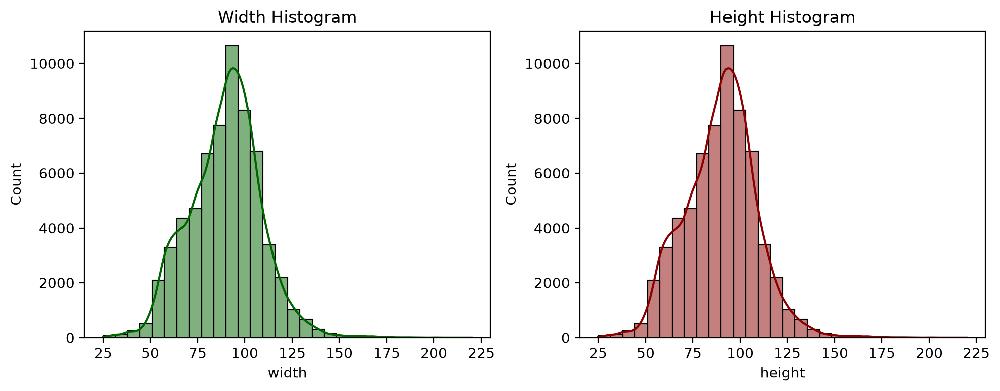

In [9]:
fig, axs=plt.subplots(1,2,figsize=(10,4))
sns.histplot(data=df_info, x='width', kde=True, bins=30, color='darkgreen', ax=axs[0])
sns.histplot(data=df_info, x='height', kde=True, bins=30, color='darkred', ax=axs[1])
axs[0].set_title('Width Histogram')
axs[1].set_title('Height Histogram')
plt.tight_layout()
plt.savefig(settings.IMG_DIR/'hw-hist.png', dpi=600)

### Note
- Width and height with mean=89 (median = 91), nearly normal, and we need resizing for our Machine Learning
- We choose to use 64x64 (closer to minimum dimensions) so enlarging low resolution is not extreme, and the 64x64 is not too big for home-pc training

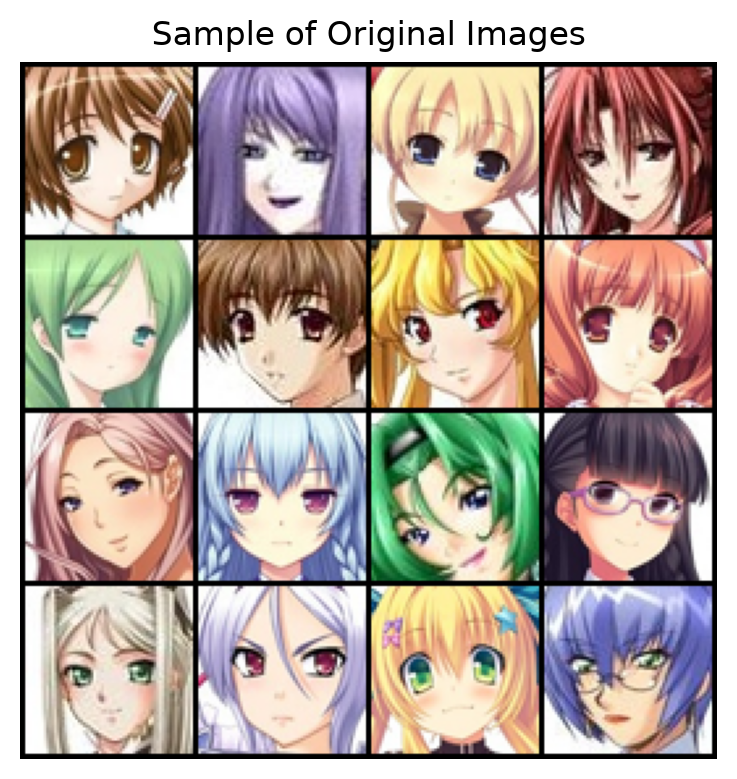

In [10]:
ut.show_sample_images_in_grid(settings.DATA_DIR/settings.DATASET_DIR, target_size= (64, 64), figsize= (4, 4), num_images = 16, images_per_row= 4, padding= 2)
plt.title("Sample of Original Images")
plt.tight_layout()
plt.savefig(settings.IMG_DIR/'sample-img-org.png', dpi=600)

# ML

## Define all settings and parameters

In [9]:
from dataclasses import dataclass, field, asdict, replace
@dataclass(frozen=True)
class DataConfig:
    batch_size:int = 64
    mean:tuple[float, float, float]= (0.5,0.5,0.5)
    std:tuple[float, float, float]= (0.5,0.5,0.5)
    latent_dim:int = 128 # embedding-dim
    n_epochs: int = 50
    show_every:int = 5 # show total-loss and sample generated image every K epoch
    image_size:int = 64
    device:torch.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    num_image_to_display_during_training: int = 16    
    #print_every: int = 330 # during traininh print every K steps    
    #----------------------
    #Loss function
    #kld_weight:float = 0.00025 # VAE, KL Divergance weight in loss calculation
    # kld_weight_max: max extra increase above kld_weight: increase from kld_weight at epoch 1 to kld_weight_max+kld_weight at last epoch
    # kld_weight_total = kld_weight + kld_weight_max*(epoch/epoch_max)^P (P 3 to 5)
    #kld_weight_max:float = 0.0001 # It was 0.0001 for 50 epoch make it 0.00025 for 100 epoch
    #kld_weight_fixed:bool = False # if we use fixed kld_weight or increase to max as epoch increase
    #reduction:str = 'mean' # MSE/KLD loss reduction method: mean or sum
    #rec_loss_type:str = 'BCE' # Reconstruction Loss Type: BCE (only when pixels in [0,1]), MSE, L1, MSEL1
    #----------------------------
    #Optimizer
    lr:float = 0.005
    betas:tuple[float, float] = (0.9, 0.999)
    weight_decay: float = 0.0
    gamma = 0.95 # gamma value for ExponentialLR scheduler
    #--------------------------------
    # ConvBlock/DeconvBlock
    batch_norm:bool = True # whether to apply BatchNorm2D after Conv2D
    bias_negate_batch_norm:bool=True # if True, we set bias to False when we use batch-norm, otherwise Fixed=False
    negative_slope:float = 0.2 # negative_slope of LeakyReLU (zero means ReLU), default for LeakyReLU is 1e-2
    #------------------------------
    # Encoder / Decoder(Generator)
    conv_dim: int = 64 # number of filters in first layer of Encoder
    num_conv_layer:int = 4 # number of conv/deconv layer in Encoder/Decoder
    last_activation_sigmoid:bool = False # sigmoid if True, otherwise Tanh (if transformed image is [0,1]-> Sigmoid, if [-1,1]-> Tanh
    #--------------------------------
    #test_ratio:float = 0.1
    #valid_ratio:float = 0.1

    dataset_len:int = 0 # set when defined using CFG=replace(CFG, dataset_len=value)
    total_batch:int = 0 # set later as dataset_len/batch_size
    total_steps:int = 0 # set later as total_batch*n_epochs
    add_instance_noise:bool = True
    total_steps_60_pct:int = 1 # set later, when we add instance noise we only add at first 60 percent of total-steps, 1 used for add_instance_noise=False
    n_critic:int = 2 # update critic 2 times then once the generator
    num_image_to_display_during_training: int = 16
    ema_decay:float = 0.999 # Exponential Moving Average Decay
    print_every: int = 330 # during traininh print every K steps
    #generated_samples_path:Path = settings.OUT_DIR/'generated_samples_dcgan.pkl'
    training_losses_path:Path = settings.OUT_DIR/'training_losses_dcgan.npy'

    #
    model_name:str = 'DCGAN50' #a name for model for tracking/visualization/saving    
    best_model_param_path: Path = field(init=False) #settings.OUT_DIR/f'best_model_param_{model_name}.pth'
    last_model_param_path: Path = field(init=False) #settings.OUT_DIR/f'last_model_param_{model_name}.pth'
    training_history_path: Path = field(init=False) #settings.OUT_DIR/f'training_history_{model_name}.csv'
    generated_samples_path: Path = field(init=False) #settings.OUT_DIR/f'generated_samples_{model_name}.pkl'

    def __post_init__(self):                
        object.__setattr__(self, 'best_model_param_path', settings.OUT_DIR / f'best_model_param_{self.model_name}.pth')
        object.__setattr__(self, 'last_model_param_path', settings.OUT_DIR / f'last_model_param_{self.model_name}.pth')
        object.__setattr__(self, 'training_history_path', settings.OUT_DIR / f'training_history_{self.model_name}.csv')
        object.__setattr__(self, 'generated_samples_path', settings.OUT_DIR / f'generated_samples_{self.model_name}.pkl')

#--------------------------------------------------
CFG = DataConfig()

## Load Training Dataset
- Full Dataset used for training (no validation or test used in our DCGAN)

In [12]:
dataloader = dcgan.data.get_dataloader(CFG)

In [13]:
dataset_len = len(dataloader.dataset)
total_batch = len(dataloader) # round(dataset_len/CFG.batch_size)
total_steps = total_batch*CFG.n_epochs
if CFG.add_instance_noise:
    total_steps_60_pct=int(total_steps *60/100) # total_steps_60_pct = 60% of total steps where we set noise-std =0
else:
    total_steps_60_pct = 1 # this effectively avoid adding noise
CFG=replace(CFG, dataset_len=dataset_len, total_batch = total_batch, total_steps = total_steps, total_steps_60_pct = total_steps_60_pct)
print(f'dataset-len = {CFG.dataset_len}, total_batch = {CFG.total_batch}, total_steps= {CFG.total_steps}, total_steps_60_pct= {total_steps_60_pct}')

dataset-len = 63565, total_batch = 994, total_steps= 49700, total_steps_60_pct= 29820


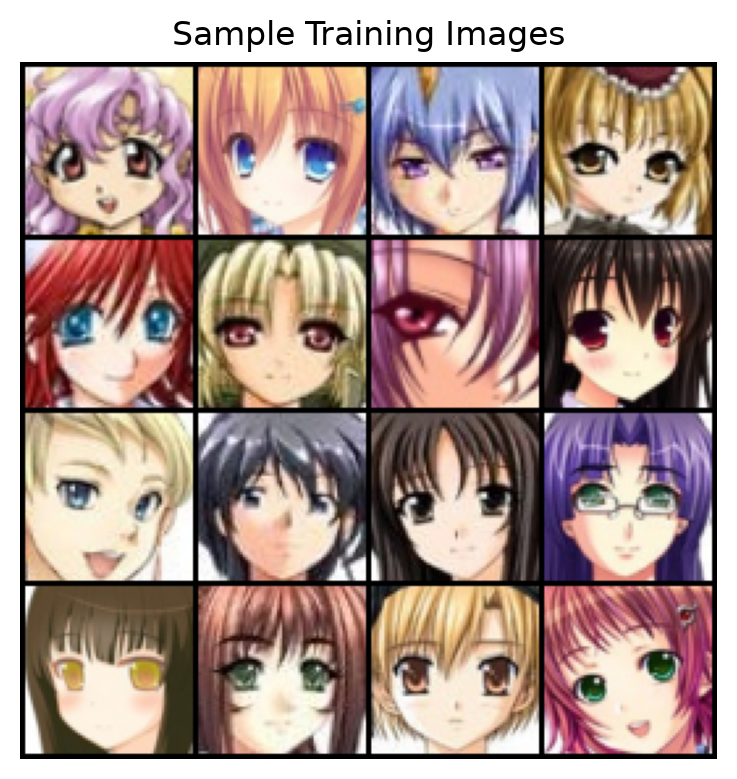

In [14]:
##Check few image from dataloader, using torchvision.utils.make_grid, normalize=True, convert -1,1 range to 0,1 for imshow
real_batch = next(iter(dataloader))
plt.figure(figsize=(4, 4))
plt.axis("off")
plt.title("Sample Training Images")
# Convert from (C, H, W) to (H, W, C) for matplotlib, using numpy transpose 1,2,0 or pytorch permute on grid tensor
# Cleanest version (if real_batch is still on CPU)
grid = torchvision.utils.make_grid(real_batch[0][:16], nrow=4, padding=2, normalize=True)
plt.imshow(grid.permute(1, 2, 0).numpy());
plt.tight_layout()
plt.savefig(settings.IMG_DIR/'sample-img-train.png', dpi=600)

# Define DCGAN model

In [15]:
generator = dcgan.model.Generator(CFG).to(CFG.device)
discriminator = dcgan.model.Discriminator(CFG).to(CFG.device)


## Define Optimizer and Scheduler

In [16]:
g_optimizer, d_optimizer = dcgan.optim.get_optimizers(generator, discriminator)

# Define the Loss function

In [17]:
#loss_fn = vae.loss.vae_loss_function

## Train the model

Epoch [1/50] | Batch 0/994 | d_loss: 1.4005 | g_loss: 2.0869
Epoch [1/50] | Batch 330/994 | d_loss: 0.3996 | g_loss: 3.7358
Epoch [1/50] | Batch 660/994 | d_loss: 0.3802 | g_loss: 3.6834
Epoch [1/50] | Batch 990/994 | d_loss: 0.4076 | g_loss: 1.9766


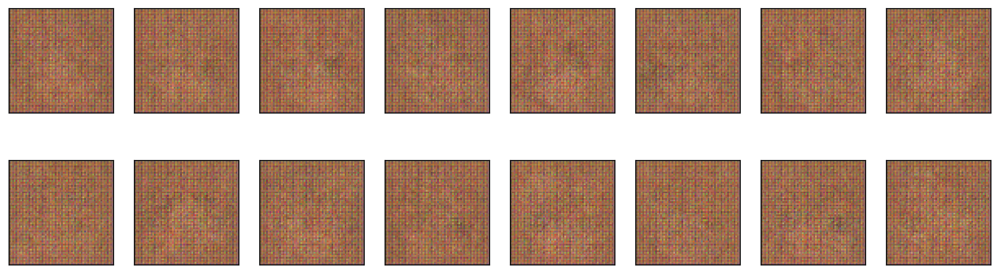

Epoch [2/50] | Batch 0/994 | d_loss: 0.4224 | g_loss: 2.3722
Epoch [2/50] | Batch 330/994 | d_loss: 0.3842 | g_loss: 1.7185
Epoch [2/50] | Batch 660/994 | d_loss: 0.4459 | g_loss: 2.7820
Epoch [2/50] | Batch 990/994 | d_loss: 0.3596 | g_loss: 1.1703


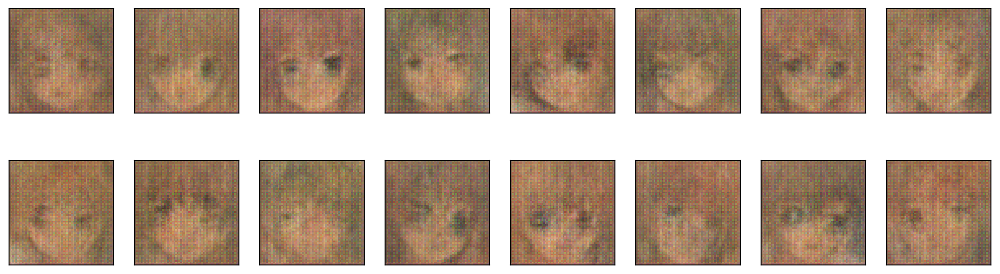

Epoch [3/50] | Batch 0/994 | d_loss: 0.3921 | g_loss: 0.3980
Epoch [3/50] | Batch 330/994 | d_loss: 0.4022 | g_loss: 1.5597
Epoch [3/50] | Batch 660/994 | d_loss: 0.3851 | g_loss: 2.1615
Epoch [3/50] | Batch 990/994 | d_loss: 0.3603 | g_loss: 1.9461


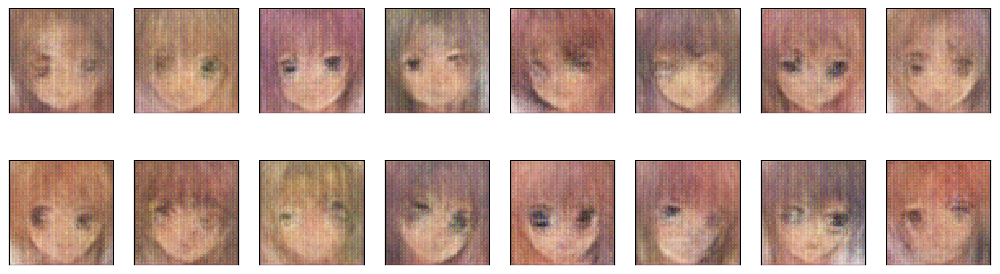

Epoch [4/50] | Batch 0/994 | d_loss: 0.3708 | g_loss: 1.6632
Epoch [4/50] | Batch 330/994 | d_loss: 0.3577 | g_loss: 1.3433
Epoch [4/50] | Batch 660/994 | d_loss: 0.3568 | g_loss: 0.9031
Epoch [4/50] | Batch 990/994 | d_loss: 0.3814 | g_loss: 1.7949


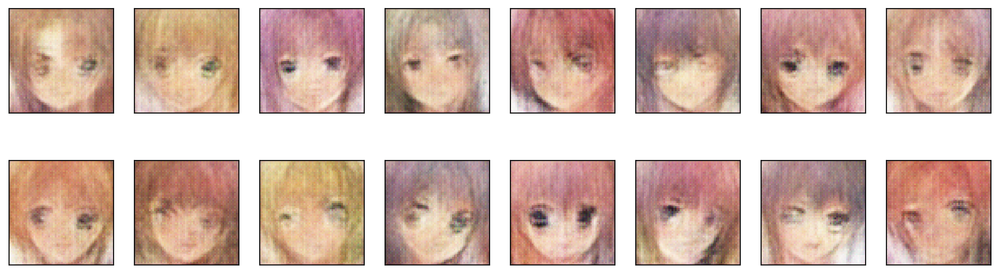

Epoch [5/50] | Batch 0/994 | d_loss: 0.4656 | g_loss: 0.3568
Epoch [5/50] | Batch 330/994 | d_loss: 0.4026 | g_loss: 3.0829
Epoch [5/50] | Batch 660/994 | d_loss: 0.3893 | g_loss: 0.5489
Epoch [5/50] | Batch 990/994 | d_loss: 0.3686 | g_loss: 0.9803


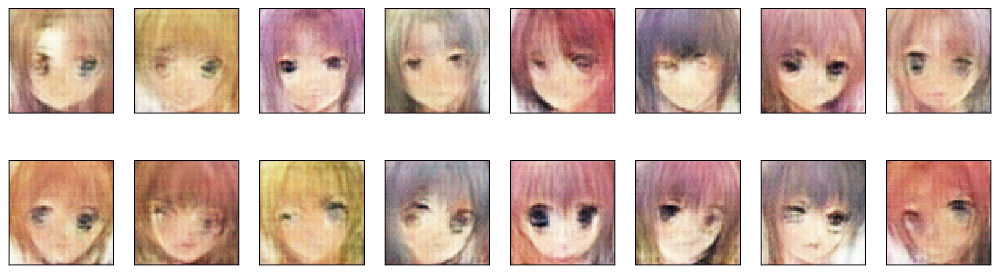

Epoch [6/50] | Batch 0/994 | d_loss: 0.3866 | g_loss: 0.3276
Epoch [6/50] | Batch 330/994 | d_loss: 0.5320 | g_loss: 2.6871
Epoch [6/50] | Batch 660/994 | d_loss: 0.3525 | g_loss: 0.3886
Epoch [6/50] | Batch 990/994 | d_loss: 0.3937 | g_loss: 0.1117


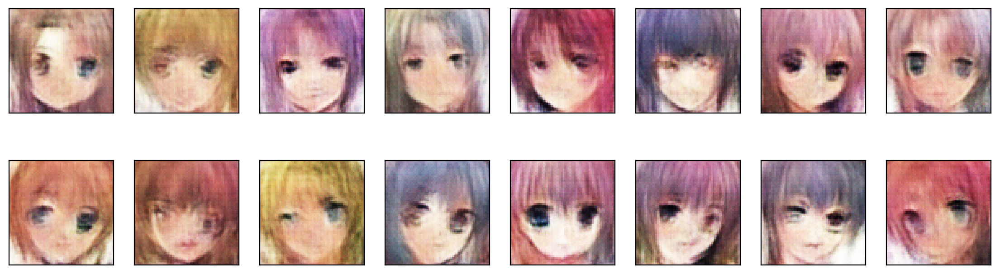

Epoch [7/50] | Batch 0/994 | d_loss: 1.5648 | g_loss: 7.4910
Epoch [7/50] | Batch 330/994 | d_loss: 0.3870 | g_loss: 1.0233
Epoch [7/50] | Batch 660/994 | d_loss: 0.3573 | g_loss: 0.4172
Epoch [7/50] | Batch 990/994 | d_loss: 0.3757 | g_loss: 0.5815


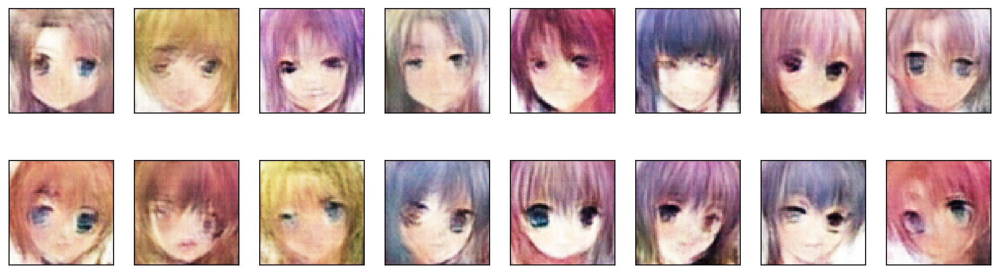

Epoch [8/50] | Batch 0/994 | d_loss: 0.4423 | g_loss: 0.2203
Epoch [8/50] | Batch 330/994 | d_loss: 0.4023 | g_loss: 0.4127
Epoch [8/50] | Batch 660/994 | d_loss: 0.4233 | g_loss: 0.7388
Epoch [8/50] | Batch 990/994 | d_loss: 0.3953 | g_loss: 1.2485


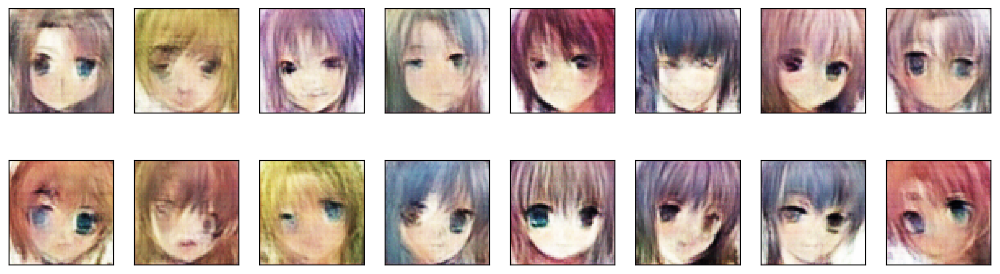

Epoch [9/50] | Batch 0/994 | d_loss: 0.3578 | g_loss: 0.9761
Epoch [9/50] | Batch 330/994 | d_loss: 0.3492 | g_loss: 0.4058
Epoch [9/50] | Batch 660/994 | d_loss: 0.3419 | g_loss: 0.2781
Epoch [9/50] | Batch 990/994 | d_loss: 0.3446 | g_loss: 1.4176


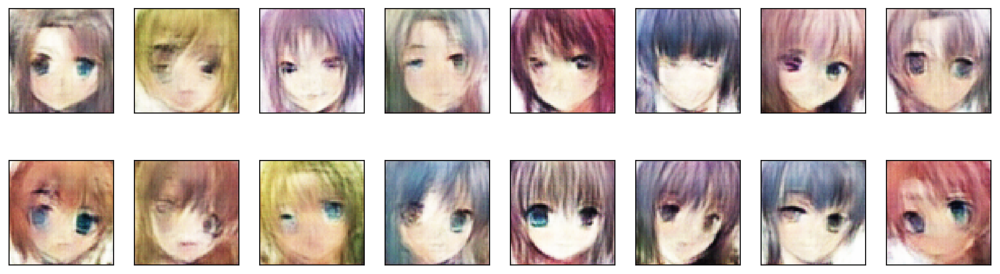

Epoch [10/50] | Batch 0/994 | d_loss: 0.3787 | g_loss: 0.6774
Epoch [10/50] | Batch 330/994 | d_loss: 0.3928 | g_loss: 0.4914
Epoch [10/50] | Batch 660/994 | d_loss: 0.3662 | g_loss: 0.1255
Epoch [10/50] | Batch 990/994 | d_loss: 0.3448 | g_loss: 0.1570


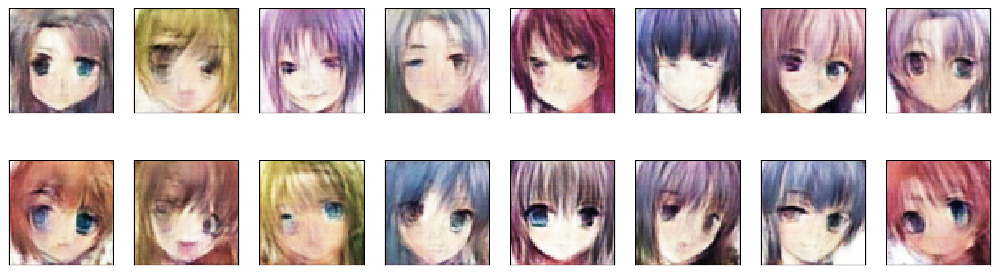

Epoch [11/50] | Batch 0/994 | d_loss: 0.3772 | g_loss: 0.0928
Epoch [11/50] | Batch 330/994 | d_loss: 0.3359 | g_loss: 0.1596
Epoch [11/50] | Batch 660/994 | d_loss: 0.3453 | g_loss: 0.2714
Epoch [11/50] | Batch 990/994 | d_loss: 0.3386 | g_loss: 0.1703


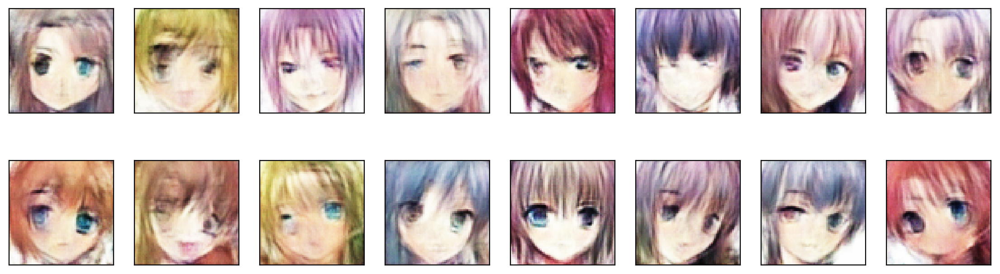

Epoch [12/50] | Batch 0/994 | d_loss: 0.3322 | g_loss: 0.1887
Epoch [12/50] | Batch 330/994 | d_loss: 0.3655 | g_loss: 0.1476
Epoch [12/50] | Batch 660/994 | d_loss: 0.3803 | g_loss: 4.6209
Epoch [12/50] | Batch 990/994 | d_loss: 0.4349 | g_loss: 0.6318


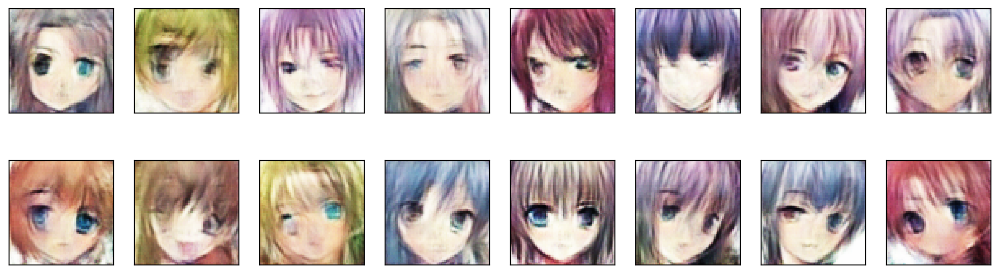

Epoch [13/50] | Batch 0/994 | d_loss: 0.4690 | g_loss: 0.7871
Epoch [13/50] | Batch 330/994 | d_loss: 0.3443 | g_loss: 0.3808
Epoch [13/50] | Batch 660/994 | d_loss: 0.3394 | g_loss: 0.1653
Epoch [13/50] | Batch 990/994 | d_loss: 0.3388 | g_loss: 0.1511


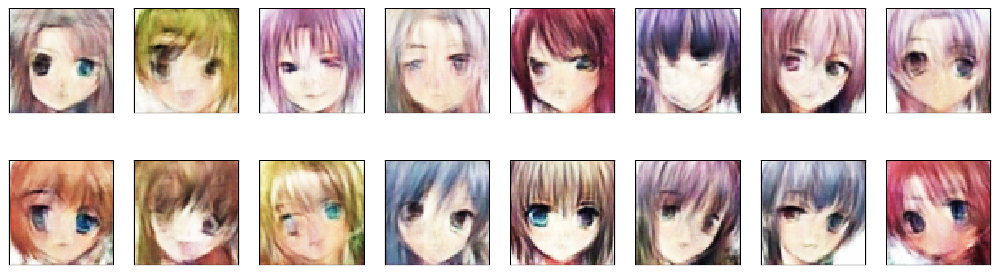

Epoch [14/50] | Batch 0/994 | d_loss: 0.3366 | g_loss: 0.1612
Epoch [14/50] | Batch 330/994 | d_loss: 0.3347 | g_loss: 0.1198
Epoch [14/50] | Batch 660/994 | d_loss: 0.8744 | g_loss: 2.6379
Epoch [14/50] | Batch 990/994 | d_loss: 0.3983 | g_loss: 2.1031


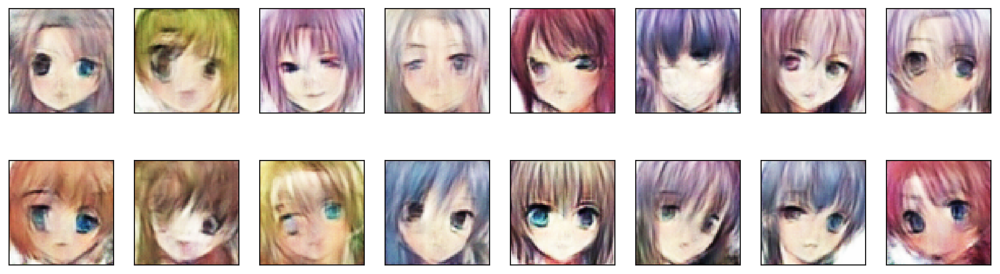

Epoch [15/50] | Batch 0/994 | d_loss: 0.4213 | g_loss: 1.0793
Epoch [15/50] | Batch 330/994 | d_loss: 0.3553 | g_loss: 0.2606
Epoch [15/50] | Batch 660/994 | d_loss: 0.3707 | g_loss: 0.0844
Epoch [15/50] | Batch 990/994 | d_loss: 0.3641 | g_loss: 0.1496


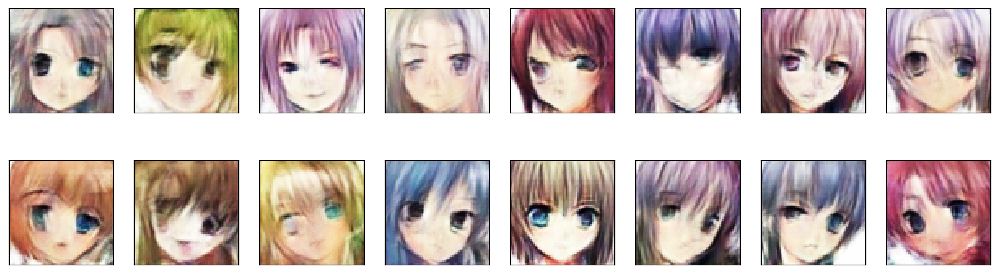

Epoch [16/50] | Batch 0/994 | d_loss: 0.3323 | g_loss: 0.1375
Epoch [16/50] | Batch 330/994 | d_loss: 0.3562 | g_loss: 0.3591
Epoch [16/50] | Batch 660/994 | d_loss: 0.3447 | g_loss: 0.1063
Epoch [16/50] | Batch 990/994 | d_loss: 0.3696 | g_loss: 0.9594


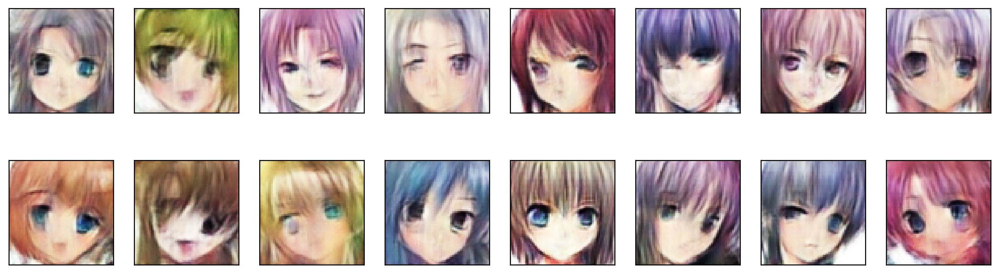

Epoch [17/50] | Batch 0/994 | d_loss: 0.4169 | g_loss: 1.1222
Epoch [17/50] | Batch 330/994 | d_loss: 0.3546 | g_loss: 0.1787
Epoch [17/50] | Batch 660/994 | d_loss: 0.3314 | g_loss: 0.2182
Epoch [17/50] | Batch 990/994 | d_loss: 0.6618 | g_loss: 2.6082


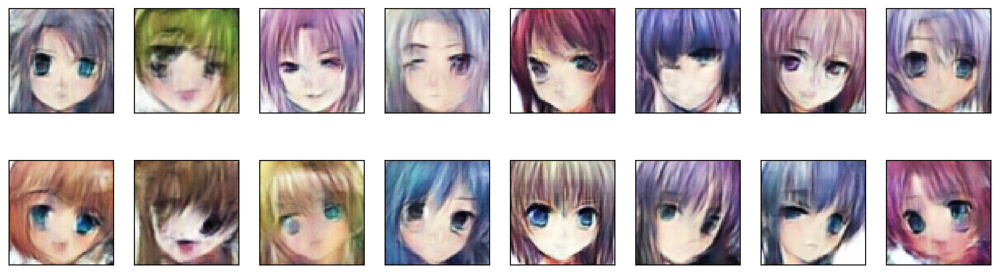

Epoch [18/50] | Batch 0/994 | d_loss: 0.3961 | g_loss: 3.1237
Epoch [18/50] | Batch 330/994 | d_loss: 0.3490 | g_loss: 0.2752
Epoch [18/50] | Batch 660/994 | d_loss: 0.3370 | g_loss: 0.1323
Epoch [18/50] | Batch 990/994 | d_loss: 0.3419 | g_loss: 0.2800


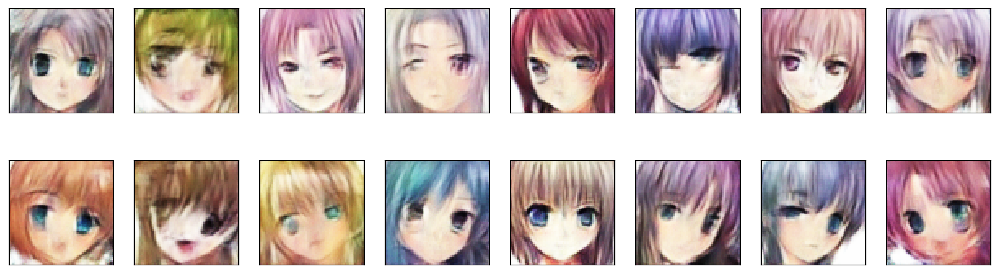

Epoch [19/50] | Batch 0/994 | d_loss: 3.8100 | g_loss: 5.6033
Epoch [19/50] | Batch 330/994 | d_loss: 0.3559 | g_loss: 0.1593
Epoch [19/50] | Batch 660/994 | d_loss: 0.3663 | g_loss: 1.2790
Epoch [19/50] | Batch 990/994 | d_loss: 0.3531 | g_loss: 0.4876


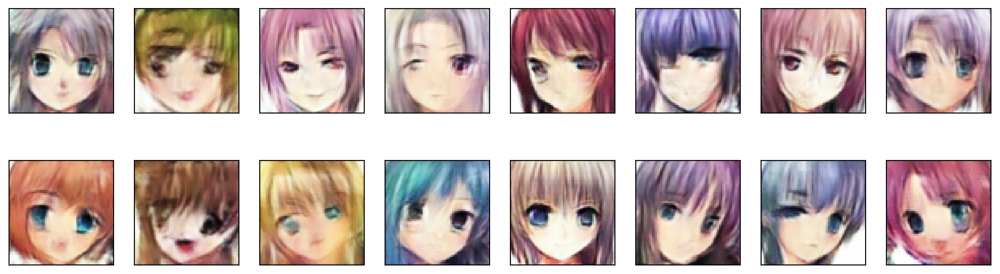

Epoch [20/50] | Batch 0/994 | d_loss: 0.3693 | g_loss: 0.4916
Epoch [20/50] | Batch 330/994 | d_loss: 0.3740 | g_loss: 0.5685
Epoch [20/50] | Batch 660/994 | d_loss: 0.3462 | g_loss: 2.6632
Epoch [20/50] | Batch 990/994 | d_loss: 0.4115 | g_loss: 2.1463


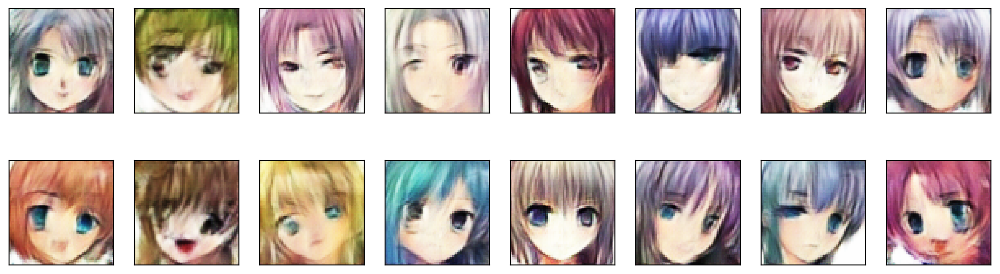

Epoch [21/50] | Batch 0/994 | d_loss: 0.3821 | g_loss: 1.6908
Epoch [21/50] | Batch 330/994 | d_loss: 0.3380 | g_loss: 1.0694
Epoch [21/50] | Batch 660/994 | d_loss: 1.1848 | g_loss: 5.0651
Epoch [21/50] | Batch 990/994 | d_loss: 0.3400 | g_loss: 1.3400


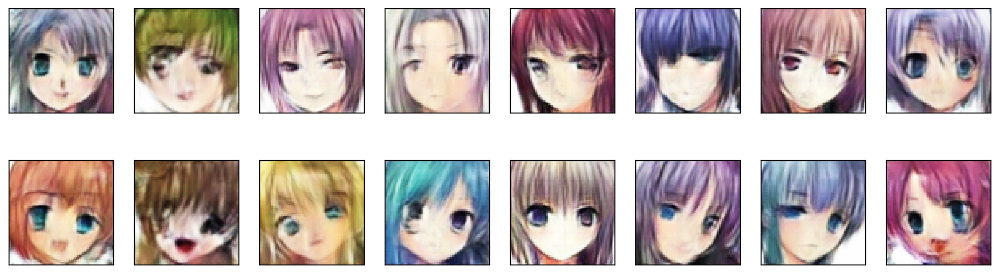

Epoch [22/50] | Batch 0/994 | d_loss: 0.3598 | g_loss: 0.9666
Epoch [22/50] | Batch 330/994 | d_loss: 0.3418 | g_loss: 0.5582
Epoch [22/50] | Batch 660/994 | d_loss: 0.3411 | g_loss: 1.7906
Epoch [22/50] | Batch 990/994 | d_loss: 0.3445 | g_loss: 0.6672


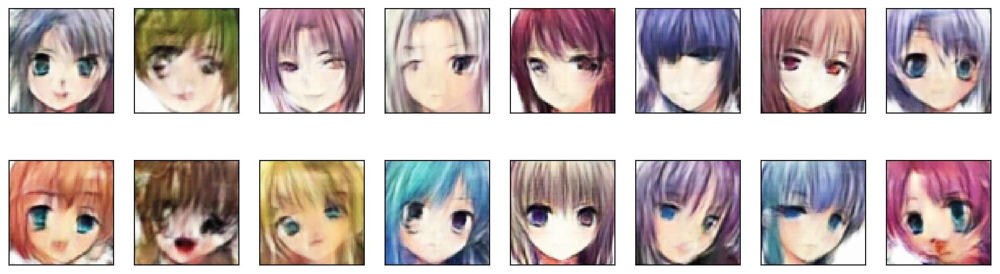

Epoch [23/50] | Batch 0/994 | d_loss: 0.4320 | g_loss: 0.8666
Epoch [23/50] | Batch 330/994 | d_loss: 0.3381 | g_loss: 1.5299
Epoch [23/50] | Batch 660/994 | d_loss: 0.3561 | g_loss: 0.4569
Epoch [23/50] | Batch 990/994 | d_loss: 0.3928 | g_loss: 0.7392


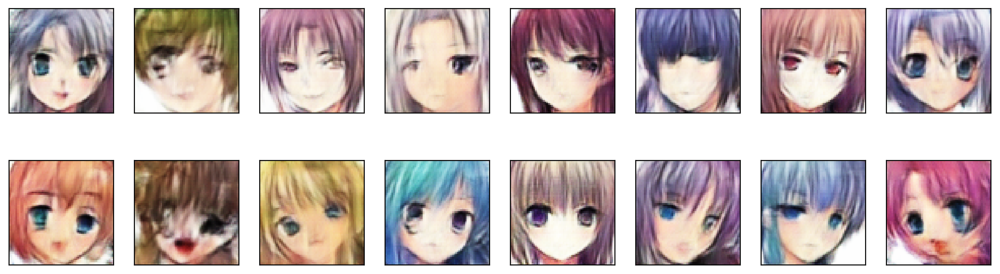

Epoch [24/50] | Batch 0/994 | d_loss: 0.9808 | g_loss: 6.2670
Epoch [24/50] | Batch 330/994 | d_loss: 0.3416 | g_loss: 1.0058
Epoch [24/50] | Batch 660/994 | d_loss: 0.3418 | g_loss: 1.7911
Epoch [24/50] | Batch 990/994 | d_loss: 0.3787 | g_loss: 3.3084


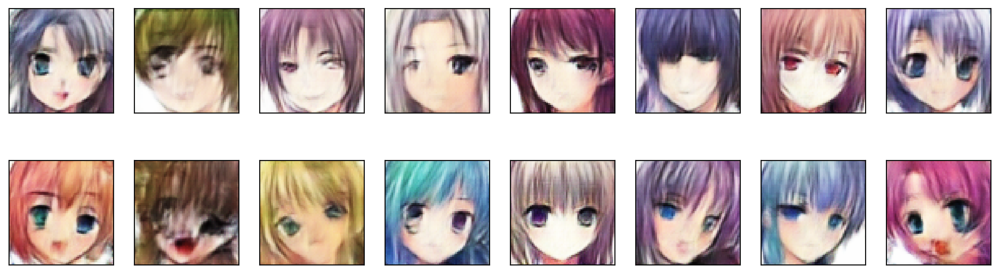

Epoch [25/50] | Batch 0/994 | d_loss: 0.3951 | g_loss: 2.8757
Epoch [25/50] | Batch 330/994 | d_loss: 0.3500 | g_loss: 3.0373
Epoch [25/50] | Batch 660/994 | d_loss: 0.3916 | g_loss: 3.1384
Epoch [25/50] | Batch 990/994 | d_loss: 0.3420 | g_loss: 2.6763


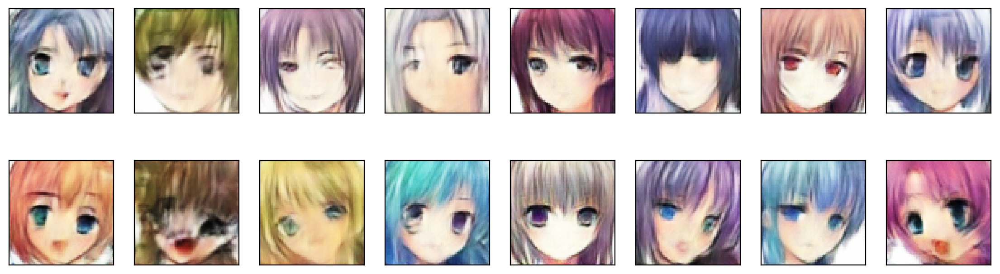

Epoch [26/50] | Batch 0/994 | d_loss: 0.3578 | g_loss: 2.6342
Epoch [26/50] | Batch 330/994 | d_loss: 0.3434 | g_loss: 3.3021
Epoch [26/50] | Batch 660/994 | d_loss: 0.3426 | g_loss: 3.5928
Epoch [26/50] | Batch 990/994 | d_loss: 0.3489 | g_loss: 3.4130


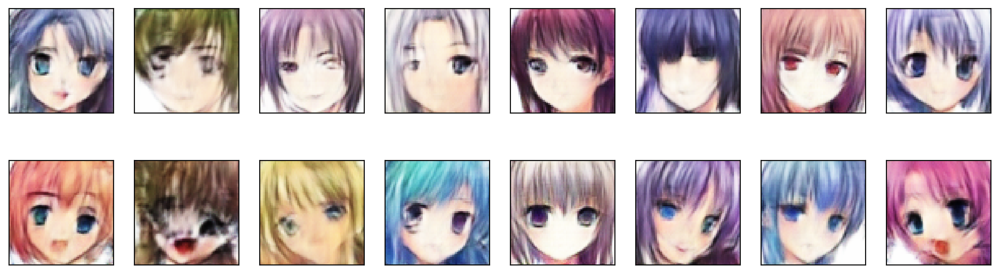

Epoch [27/50] | Batch 0/994 | d_loss: 0.3690 | g_loss: 3.5076
Epoch [27/50] | Batch 330/994 | d_loss: 0.5490 | g_loss: 4.3220
Epoch [27/50] | Batch 660/994 | d_loss: 0.3428 | g_loss: 4.9467
Epoch [27/50] | Batch 990/994 | d_loss: 0.3499 | g_loss: 5.0655


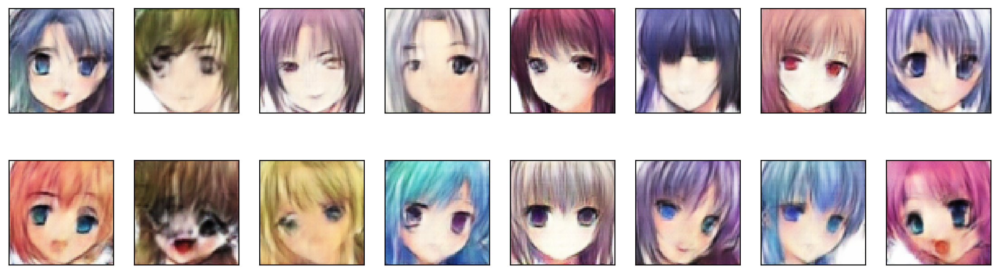

Epoch [28/50] | Batch 0/994 | d_loss: 0.3456 | g_loss: 4.2473
Epoch [28/50] | Batch 330/994 | d_loss: 0.3414 | g_loss: 5.9273
Epoch [28/50] | Batch 660/994 | d_loss: 0.3487 | g_loss: 5.3320
Epoch [28/50] | Batch 990/994 | d_loss: 0.3503 | g_loss: 5.3596


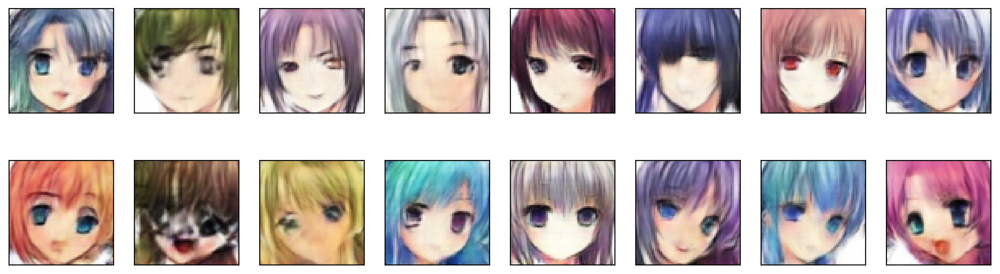

Epoch [29/50] | Batch 0/994 | d_loss: 0.3581 | g_loss: 4.0854
Epoch [29/50] | Batch 330/994 | d_loss: 0.3505 | g_loss: 5.3522
Epoch [29/50] | Batch 660/994 | d_loss: 0.3491 | g_loss: 6.4111
Epoch [29/50] | Batch 990/994 | d_loss: 0.3444 | g_loss: 5.2902


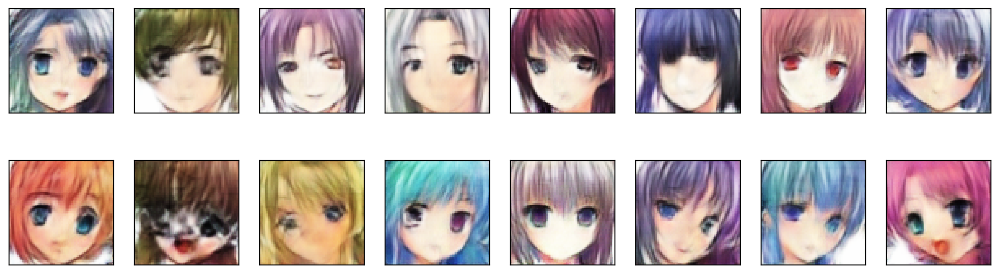

Epoch [30/50] | Batch 0/994 | d_loss: 0.3442 | g_loss: 5.8956
Epoch [30/50] | Batch 330/994 | d_loss: 0.3527 | g_loss: 6.1518
Epoch [30/50] | Batch 660/994 | d_loss: 0.4037 | g_loss: 5.2225
Epoch [30/50] | Batch 990/994 | d_loss: 0.3531 | g_loss: 6.2480


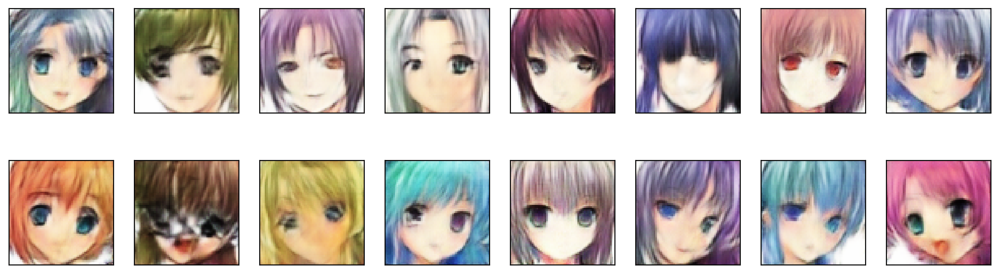

Epoch [31/50] | Batch 0/994 | d_loss: 0.3459 | g_loss: 5.9035
Epoch [31/50] | Batch 330/994 | d_loss: 0.3541 | g_loss: 6.2377
Epoch [31/50] | Batch 660/994 | d_loss: 0.3402 | g_loss: 6.8603
Epoch [31/50] | Batch 990/994 | d_loss: 0.3351 | g_loss: 6.8521


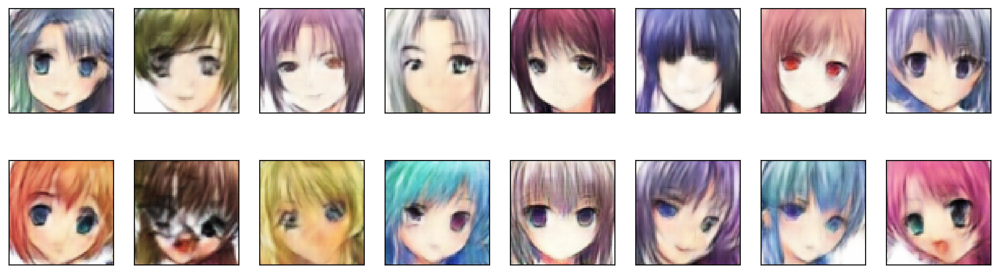

Epoch [32/50] | Batch 0/994 | d_loss: 0.3370 | g_loss: 7.4408
Epoch [32/50] | Batch 330/994 | d_loss: 0.4044 | g_loss: 4.0336
Epoch [32/50] | Batch 660/994 | d_loss: 0.3553 | g_loss: 5.7243
Epoch [32/50] | Batch 990/994 | d_loss: 0.3481 | g_loss: 5.6558


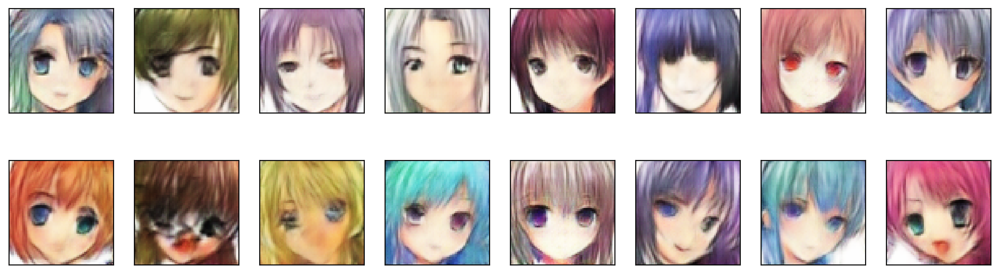

Epoch [33/50] | Batch 0/994 | d_loss: 0.4182 | g_loss: 3.4922
Epoch [33/50] | Batch 330/994 | d_loss: 0.3542 | g_loss: 6.3491
Epoch [33/50] | Batch 660/994 | d_loss: 0.3435 | g_loss: 6.4134
Epoch [33/50] | Batch 990/994 | d_loss: 0.3502 | g_loss: 7.1086


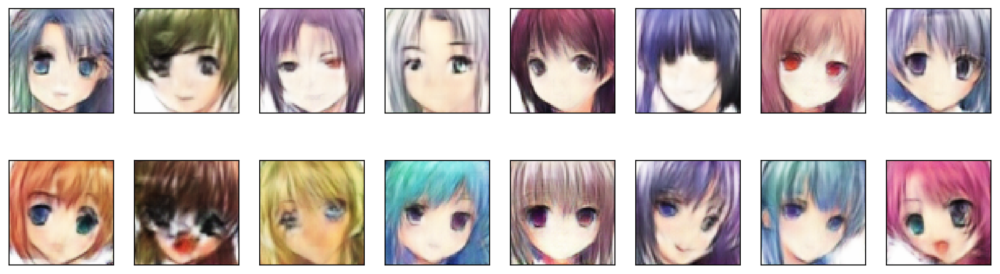

Epoch [34/50] | Batch 0/994 | d_loss: 0.3791 | g_loss: 6.8525
Epoch [34/50] | Batch 330/994 | d_loss: 0.3347 | g_loss: 6.7401
Epoch [34/50] | Batch 660/994 | d_loss: 0.4569 | g_loss: 5.5038
Epoch [34/50] | Batch 990/994 | d_loss: 0.3355 | g_loss: 7.3798


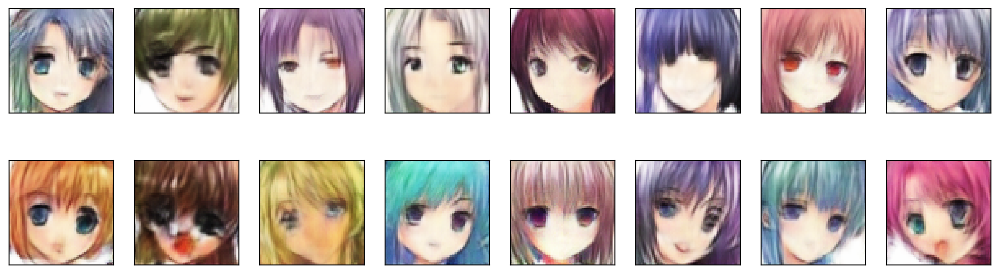

Epoch [35/50] | Batch 0/994 | d_loss: 0.3638 | g_loss: 6.9993
Epoch [35/50] | Batch 330/994 | d_loss: 0.3367 | g_loss: 5.8591
Epoch [35/50] | Batch 660/994 | d_loss: 0.3430 | g_loss: 6.7909
Epoch [35/50] | Batch 990/994 | d_loss: 0.3428 | g_loss: 7.0133


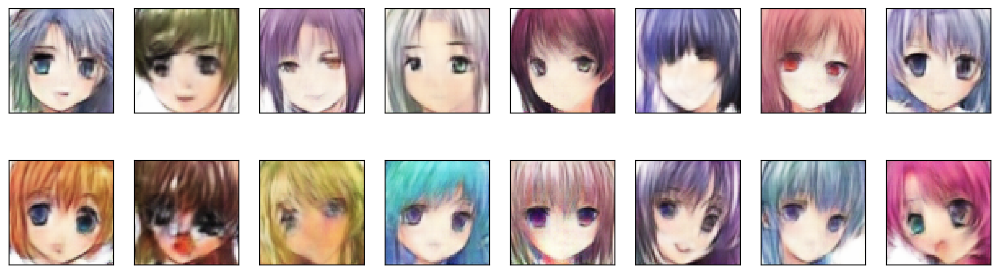

Epoch [36/50] | Batch 0/994 | d_loss: 0.4586 | g_loss: 7.0769
Epoch [36/50] | Batch 330/994 | d_loss: 0.3500 | g_loss: 5.6568
Epoch [36/50] | Batch 660/994 | d_loss: 0.4190 | g_loss: 3.6095
Epoch [36/50] | Batch 990/994 | d_loss: 0.3711 | g_loss: 5.8390


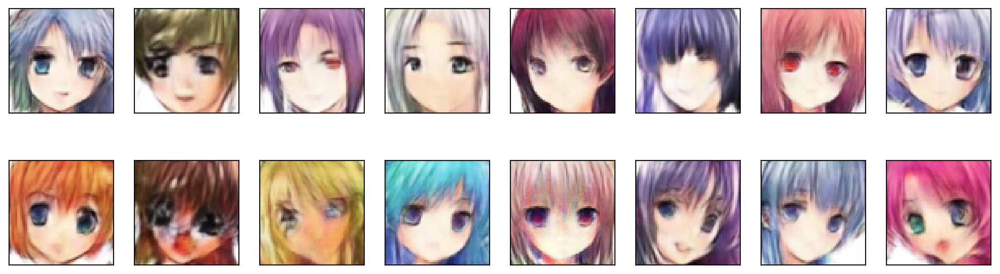

Epoch [37/50] | Batch 0/994 | d_loss: 0.3635 | g_loss: 5.3806
Epoch [37/50] | Batch 330/994 | d_loss: 0.3802 | g_loss: 7.4941
Epoch [37/50] | Batch 660/994 | d_loss: 0.3381 | g_loss: 6.7991
Epoch [37/50] | Batch 990/994 | d_loss: 0.3535 | g_loss: 5.2553


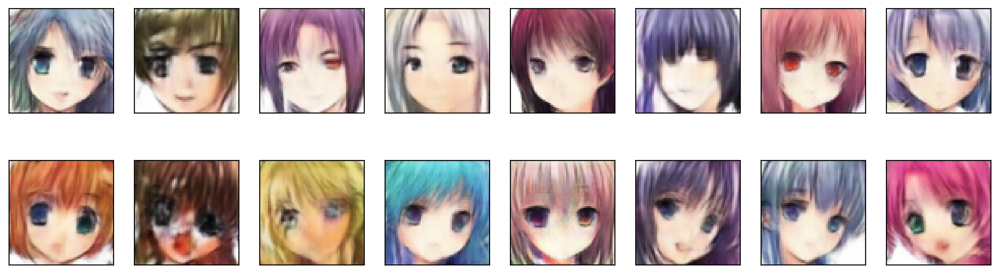

Epoch [38/50] | Batch 0/994 | d_loss: 0.5374 | g_loss: 6.2074
Epoch [38/50] | Batch 330/994 | d_loss: 0.3387 | g_loss: 6.3664
Epoch [38/50] | Batch 660/994 | d_loss: 0.3411 | g_loss: 6.9989
Epoch [38/50] | Batch 990/994 | d_loss: 0.3481 | g_loss: 5.8242


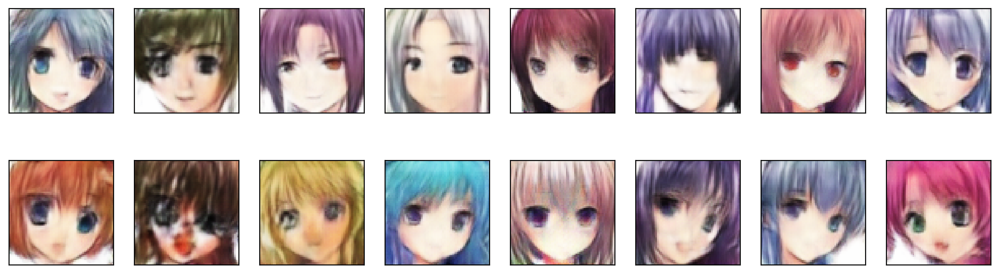

Epoch [39/50] | Batch 0/994 | d_loss: 0.3396 | g_loss: 6.3563
Epoch [39/50] | Batch 330/994 | d_loss: 0.3424 | g_loss: 6.6172
Epoch [39/50] | Batch 660/994 | d_loss: 0.3384 | g_loss: 6.3059
Epoch [39/50] | Batch 990/994 | d_loss: 0.3376 | g_loss: 6.8642


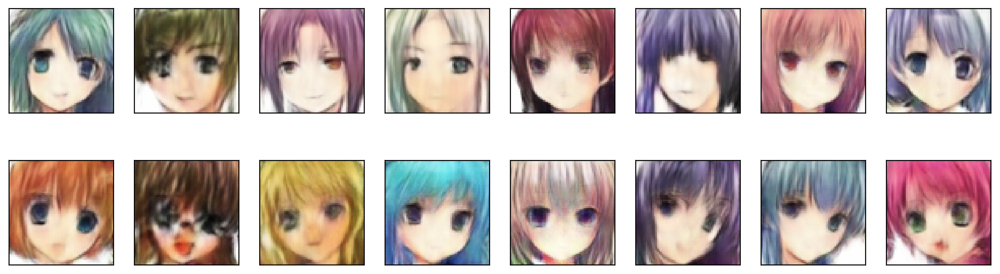

Epoch [40/50] | Batch 0/994 | d_loss: 0.3427 | g_loss: 6.4005
Epoch [40/50] | Batch 330/994 | d_loss: 0.3371 | g_loss: 7.9457
Epoch [40/50] | Batch 660/994 | d_loss: 0.3622 | g_loss: 7.1503
Epoch [40/50] | Batch 990/994 | d_loss: 0.3385 | g_loss: 6.7342


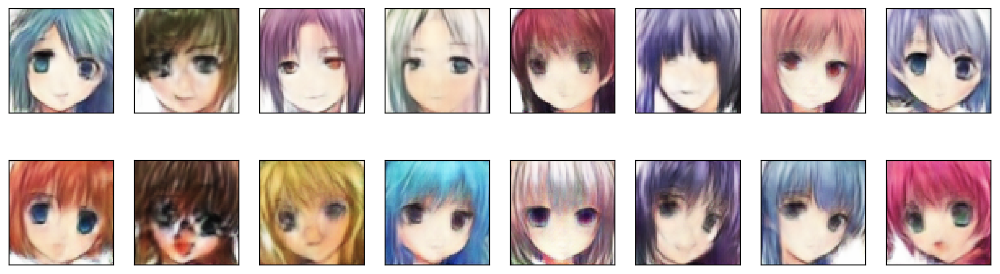

Epoch [41/50] | Batch 0/994 | d_loss: 0.3380 | g_loss: 6.7543
Epoch [41/50] | Batch 330/994 | d_loss: 0.3373 | g_loss: 8.0071
Epoch [41/50] | Batch 660/994 | d_loss: 0.3455 | g_loss: 6.1073
Epoch [41/50] | Batch 990/994 | d_loss: 0.3620 | g_loss: 7.3356


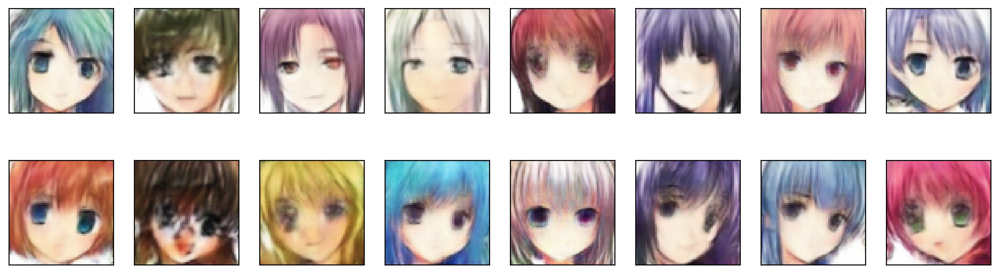

Epoch [42/50] | Batch 0/994 | d_loss: 1.4385 | g_loss: 6.6777
Epoch [42/50] | Batch 330/994 | d_loss: 0.3652 | g_loss: 4.3093
Epoch [42/50] | Batch 660/994 | d_loss: 0.3524 | g_loss: 5.7589
Epoch [42/50] | Batch 990/994 | d_loss: 0.3473 | g_loss: 6.4125


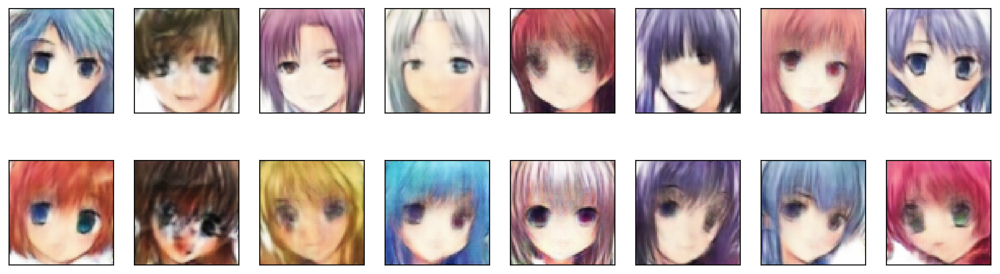

Epoch [43/50] | Batch 0/994 | d_loss: 0.3356 | g_loss: 7.2104
Epoch [43/50] | Batch 330/994 | d_loss: 0.3443 | g_loss: 6.5068
Epoch [43/50] | Batch 660/994 | d_loss: 0.3687 | g_loss: 5.1765
Epoch [43/50] | Batch 990/994 | d_loss: 0.3331 | g_loss: 7.8931


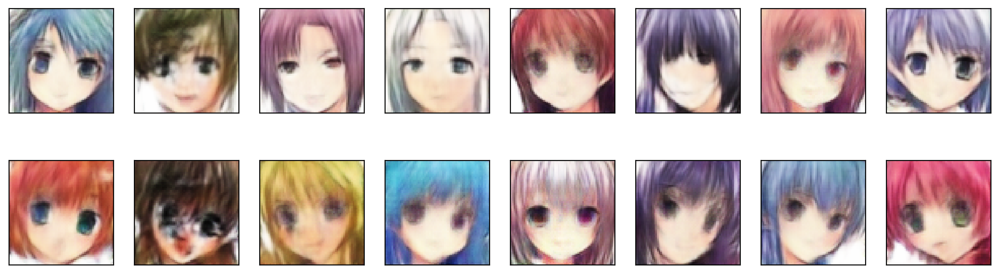

Epoch [44/50] | Batch 0/994 | d_loss: 0.3458 | g_loss: 6.8355
Epoch [44/50] | Batch 330/994 | d_loss: 0.3379 | g_loss: 6.5811
Epoch [44/50] | Batch 660/994 | d_loss: 0.3418 | g_loss: 7.3660
Epoch [44/50] | Batch 990/994 | d_loss: 0.3493 | g_loss: 5.9711


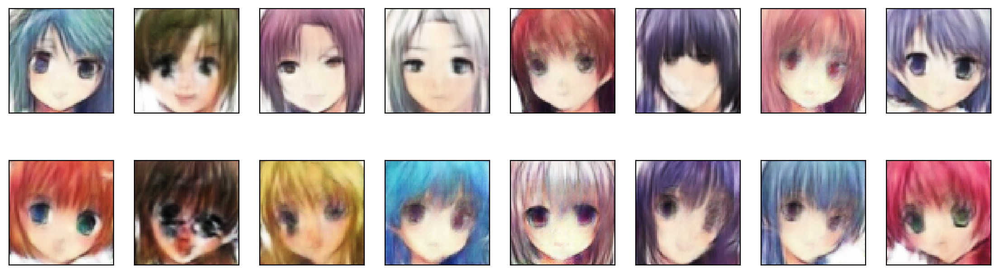

Epoch [45/50] | Batch 0/994 | d_loss: 0.3397 | g_loss: 6.5900
Epoch [45/50] | Batch 330/994 | d_loss: 0.3404 | g_loss: 7.1776
Epoch [45/50] | Batch 660/994 | d_loss: 0.3375 | g_loss: 7.4684
Epoch [45/50] | Batch 990/994 | d_loss: 0.3534 | g_loss: 5.5632


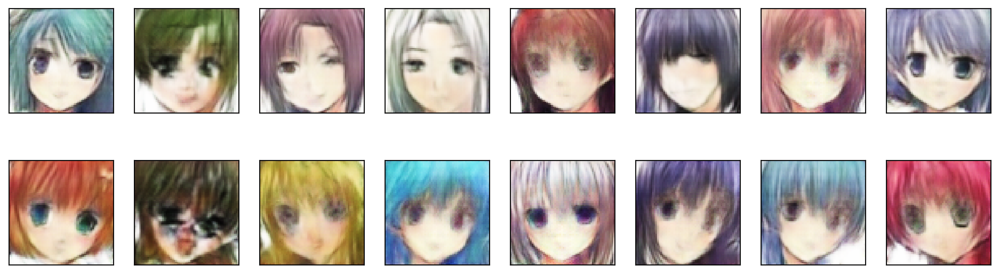

Epoch [46/50] | Batch 0/994 | d_loss: 0.3510 | g_loss: 5.2686
Epoch [46/50] | Batch 330/994 | d_loss: 0.3437 | g_loss: 5.8116
Epoch [46/50] | Batch 660/994 | d_loss: 0.3415 | g_loss: 5.5373
Epoch [46/50] | Batch 990/994 | d_loss: 0.3514 | g_loss: 6.4671


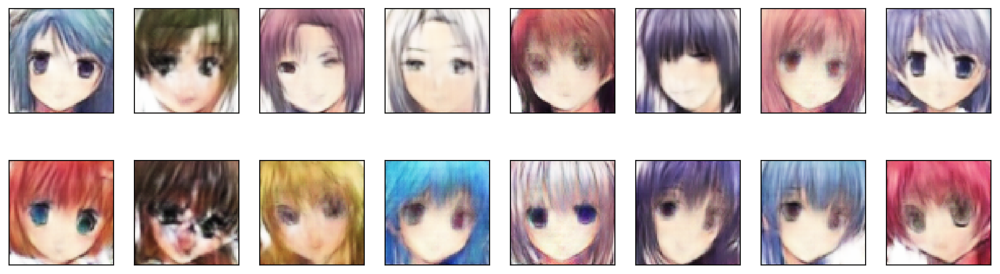

Epoch [47/50] | Batch 0/994 | d_loss: 0.3350 | g_loss: 6.2769
Epoch [47/50] | Batch 330/994 | d_loss: 0.3412 | g_loss: 5.9795
Epoch [47/50] | Batch 660/994 | d_loss: 0.3391 | g_loss: 6.9375
Epoch [47/50] | Batch 990/994 | d_loss: 0.3455 | g_loss: 6.4010


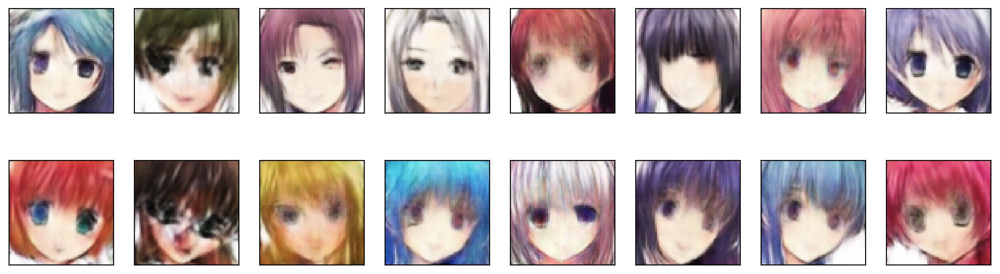

Epoch [48/50] | Batch 0/994 | d_loss: 0.3437 | g_loss: 6.8301
Epoch [48/50] | Batch 330/994 | d_loss: 0.3434 | g_loss: 5.6225
Epoch [48/50] | Batch 660/994 | d_loss: 0.3470 | g_loss: 7.2392
Epoch [48/50] | Batch 990/994 | d_loss: 0.3432 | g_loss: 6.6000


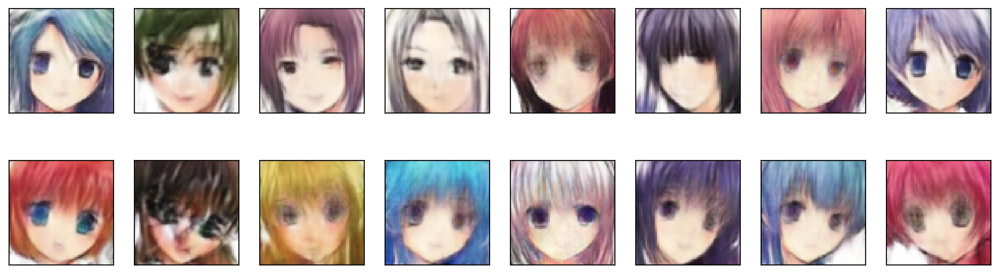

Epoch [49/50] | Batch 0/994 | d_loss: 0.3409 | g_loss: 7.3726
Epoch [49/50] | Batch 330/994 | d_loss: 0.3387 | g_loss: 6.8933
Epoch [49/50] | Batch 660/994 | d_loss: 0.3490 | g_loss: 5.8812
Epoch [49/50] | Batch 990/994 | d_loss: 0.3347 | g_loss: 6.4466


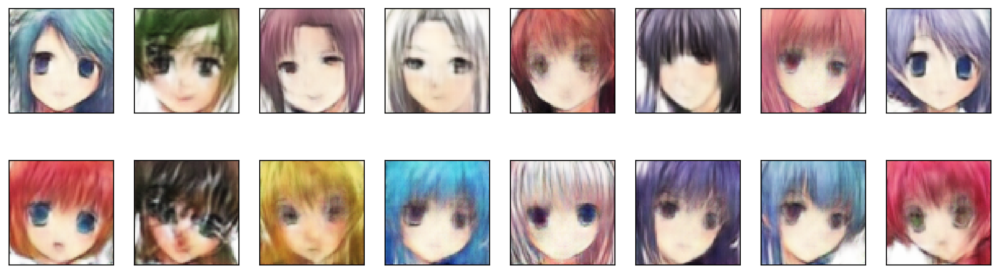

Epoch [50/50] | Batch 0/994 | d_loss: 0.3450 | g_loss: 8.6060
Epoch [50/50] | Batch 330/994 | d_loss: 0.3449 | g_loss: 6.7252
Epoch [50/50] | Batch 660/994 | d_loss: 0.3411 | g_loss: 5.9162
Epoch [50/50] | Batch 990/994 | d_loss: 0.3753 | g_loss: 4.6019


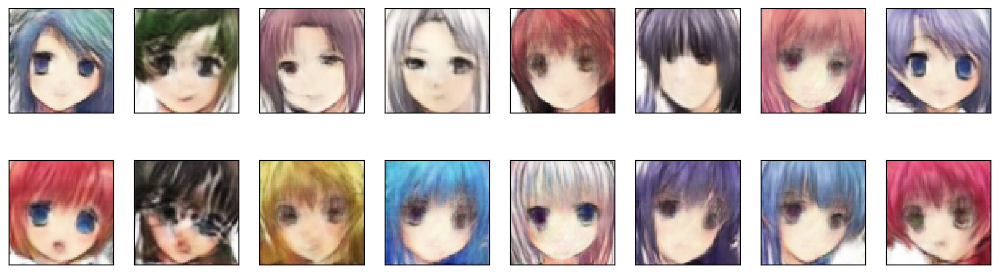

In [18]:
#model is the last model, not necessary the best-model, load model with best/min validation loss using saved checkpoint
# model, history_df, fig, valid_loss_min_epoch = vae.train.train_model(model,
#                                                dataloaders,
#                                                loss_fn,
#                                                optimizer,
#                                                scheduler,                                               
#                                                CFG,
#                                                jupyter_vis=True)
# if fig is not None: fig.savefig(settings.IMG_DIR/f'last-epoch-training-{CFG.model_name}.png', dpi=600)

dcgan.train.run_training(dataloader,
                         generator,
                         discriminator,
                         g_optimizer,
                         d_optimizer,
                         dcgan.loss.discriminator_loss,
                         dcgan.loss.generator_loss,
                         CFG)

## Check Learning curves

In [16]:
# importlib.reload(dcgan.train)
# import pickle as pkl
# with open(CFG.generated_samples_path, 'rb') as f:
#     loaded_samples = pkl.load(f)
# dcgan.train.display(loaded_samples[-1]);
# plt.tight_layout()
# plt.savefig(settings.IMG_DIR/'last-gen-during-training.png', dpi=600)

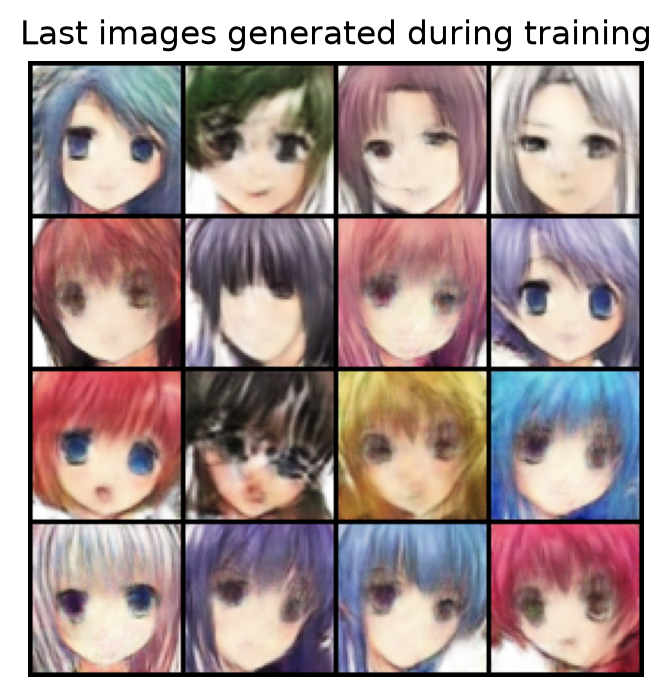

In [15]:
import pickle as pkl
with open(CFG.generated_samples_path, 'rb') as f:
    loaded_samples = pkl.load(f)
grid_gen_last = torchvision.utils.make_grid(loaded_samples[-1], nrow=4, padding=2, normalize=True, value_range=(-1, 1)) 
fig, axs = plt.subplots(1, 1, figsize=(4, 4))
axs.imshow(grid_gen_last.permute(1, 2, 0).detach().cpu().numpy())
axs.set_title(f"Last images generated during training")
axs.axis('off');
plt.savefig(settings.IMG_DIR/'last-gen-during-training.png', dpi=600)